In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from random import randrange
from PIL import Image
import sys
import os

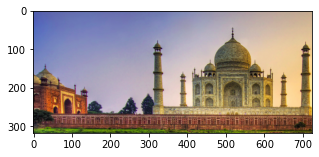

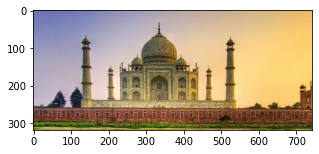

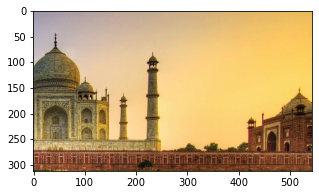

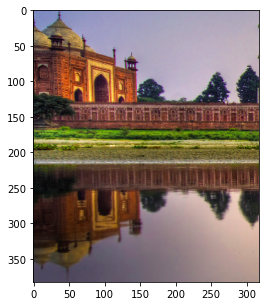

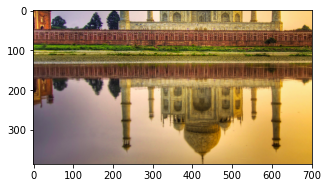

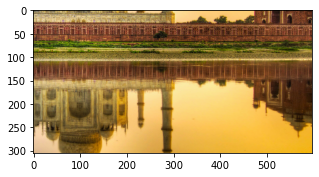

In [5]:
# question 1.1
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_1.png')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_2.png')
img3 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_3.png')
img4 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_4.png')
img5 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_5.png')
img6 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_6.png')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3g = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img4g = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
img5g = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)
img6g = cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
plt.imshow(img3g)
plt.figure(figsize=[5,5])
plt.imshow(img4g)
plt.figure(figsize=[5,5])
plt.imshow(img5g)
plt.figure(figsize=[5,5])
plt.imshow(img6g)
plt.show()

- Using ORB keypoints and detectors to find matches between the overlapping images

In [6]:
MIN_MATCH_COUNT = 40

def ORB_features(img_list):
    orb = cv2.ORB_create()

    kp_list = []
    des_list = []
    
    for im in img_list:
        gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        kp, des = orb.detectAndCompute(gray,None)
        kp_list.append(kp)
        des_list.append(des)
    
    return kp_list, des_list


- This function gets the features and matches them in both the images and returns them.
- ORB_features is called  to compute the features and use BFMatcher to find the matches. The BFMatcher() matches the features which are more similar. When we set parameter k=2, we are asking the knnMatcher to give out 2 best matches for each descriptor.
- Now, the obtained descriptors in one image are to be recognized in the image too.
- kp1 and kp2 are keypoints, des1 and des2 are the descriptors of the respective images

In [7]:
def feature_matching(img_list):
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    kp_list, des_list = ORB_features(img_list)

    # Match descriptors and sort them in the order of their distance.
    matches = bf.match(des_list[0],des_list[1])
    matches = sorted(matches, key = lambda x:x.distance)[:40]
            
    draw_params = dict(matchesMask=None, singlePointColor=None, matchColor=(0, 255, 0), flags=2)
    
    img3 = cv2.drawMatches(img_list[0], kp_list[0], img_list[1], kp_list[1], matches, None, **draw_params)
    plt.figure(figsize=[5,5])
    plt.imshow(img3)  
    
    return matches,kp_list,des_list

In [8]:
def find_homography(correspondences):
    aList = []
    for corr in correspondences:
        
        x1 = corr[0]
        x2 = corr[1]
        a2 = [0, 0, 0, -x1[0], -x1[1], -1, x2[1] *x1[0] , x2[1]*x1[1] , x2[1] ]
        a1 = [ -x1[0], -x1[1], -1,  0, 0, 0,  x2[0] * x1[0], x2[0] * x1[1], x2[0] ]
        aList.append(a1)
        aList.append(a2)

    matrixA = np.array(aList)
    u, d, v = np.linalg.svd(matrixA)
    h = np.reshape(v[8], (3, 3))
    h = h/h[2,2]
    return h

In [9]:
def geometricDistance(src,dst, h):
    p1 = np.array([src[0],src[1], 1]).T
    estimatep2 = np.dot(h, p1)
    estimatep2 = estimatep2/estimatep2[2]
    p2 = np.matrix([ dst[0], dst[1], 1])
    error = p2 - estimatep2
    
    return np.linalg.norm(error)

In [10]:
def ransac(src_pts,dst_pts, thresh, dist=5):
    maxInliers = []
    finalH = None
    for i in range(1000):
        r4 =  np.random.randint(0,len(src_pts),4)
        randomFour = []
        for x in r4:
            randomFour.append((src_pts[x,0,:], dst_pts[x,0,:] ))
            
        h = find_homography(randomFour)
        inliers = []

        for i in range(len(src_pts)):
            d = geometricDistance( src_pts[i,0,:], dst_pts[i,0,:] , h)
            if d < dist:
                inliers.append(src_pts[i,0,:])
        if len(inliers) > len(maxInliers):
            maxInliers = inliers
            finalH = h
        
        if len(maxInliers) > len(src_pts)*thresh:
            break
        
    return finalH

In [11]:
def calculate_homography(matches,kp_list):    
    if len(matches) < MIN_MATCH_COUNT:
        return None
    best_matches = matches[0:MIN_MATCH_COUNT]
    src_pts = np.float32([ kp_list[0][m.queryIdx].pt for m in best_matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp_list[1][m.trainIdx].pt for m in best_matches ]).reshape(-1,1,2)
    
    M = ransac(src_pts, dst_pts,0.1,dist=5.0)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5)
    return M

In [12]:
def get_transformation(img_list):   

    # Feature matching    
    matches,kp_list,des_list =  feature_matching(img_list)

    # Homography
    M = calculate_homography(matches,kp_list)

    h,w,c = img_list[0].shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)    
    img2 = cv2.polylines(img_list[1].copy(),[np.int32(dst)],True,255,3, cv2.LINE_AA)

    h,w,c = img_list[1].shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,np.linalg.inv(M))    
    img1 = cv2.polylines(img_list[0].copy(),[np.int32(dst)],True,255,3, cv2.LINE_AA)  

    return M

In [13]:
def stitching(img_list,M):
    dst = cv2.warpPerspective(img_list[1],np.linalg.inv(M),(img_list[0].shape[1]+img_list[1].shape[1],img_list[0].shape[0]))
    dst[0:img_list[0].shape[0],0:img_list[0].shape[1],:] = img_list[0]
    return dst
def remove_black(image):
    h, w = image.shape[:2]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    first_pass = True
    pixels = np.sum(gray, axis=0).tolist()

    # Build new image
    for index, value in enumerate(pixels):
        if value == 0:
            continue
        else:
            ROI = image[0:h, index:index+1]
            if first_pass:
                result = image[0:h, index+1:index+2]
                first_pass = False
                continue
            result = np.concatenate((result, ROI), axis=1)
    return result

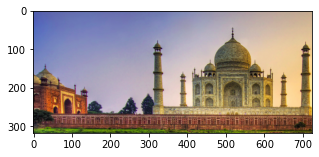

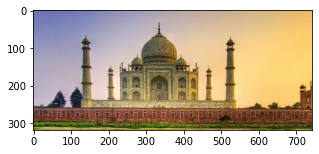

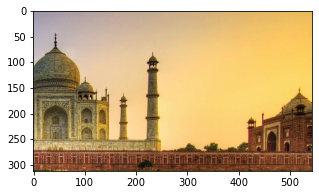

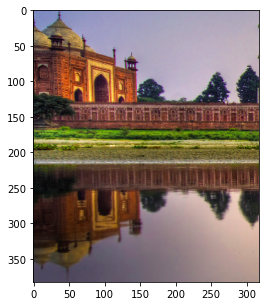

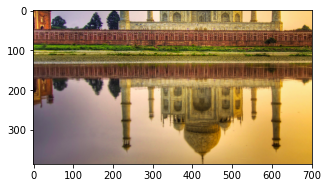

...

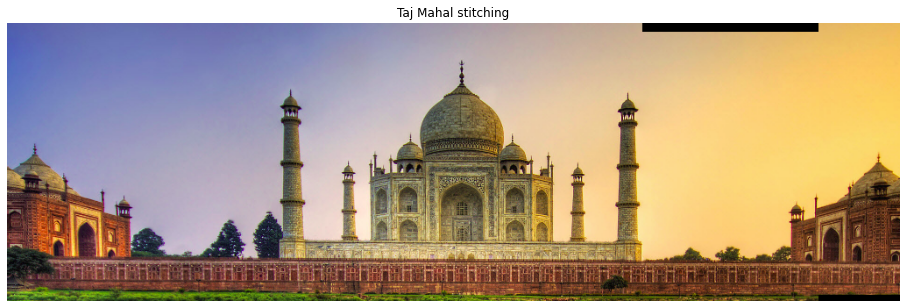

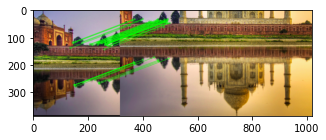

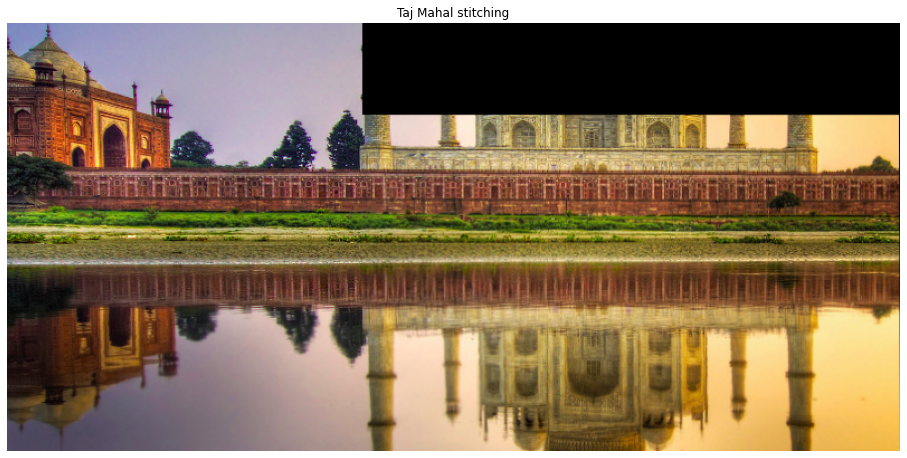

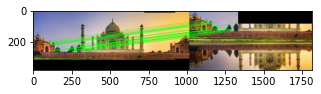

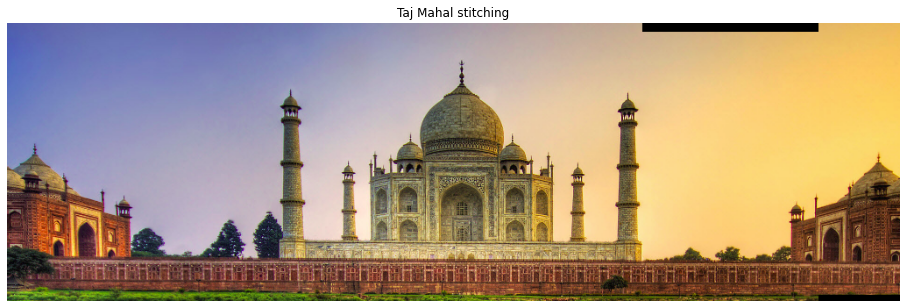

In [14]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_1.png')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_2.png')
img3 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_3.png')
img4 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_4.png')
img5 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_5.png')
img6 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/2_6.png')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3g = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img4g = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
img5g = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)
img6g = cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
plt.imshow(img3g)
plt.figure(figsize=[5,5])
plt.imshow(img4g)
plt.figure(figsize=[5,5])
plt.imshow(img5g)
plt.figure(figsize=[5,5])
plt.imshow(img6g)
img_list = []
img_list.append(img1g)
img_list.append(img4g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
img_list = []
img_list.append(final_img)
img_list.append(img2g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
img_list = []
img_list.append(final_img)
img_list.append(img3g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img1 = remove_black(final_img)
fig = plt.figure(figsize=(16,16))
plt.imshow(final_img1)
plt.axis('off')
plt.title('Taj Mahal stitching')
img_list = []
img_list.append(img4g)
img_list.append(img5g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img2 = remove_black(final_img)
fig = plt.figure(figsize=(16,16))
plt.imshow(final_img2)
plt.axis('off')
plt.title('Taj Mahal stitching')
img_list = []
img_list.append(final_img1)
img_list.append(final_img2)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
fig = plt.figure(figsize=(16,16))
plt.imshow(final_img)
plt.axis('off')
plt.title('Taj Mahal stitching')
plt.show()

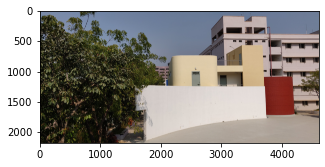

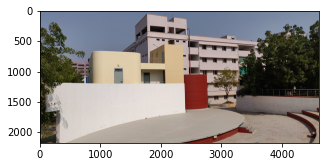

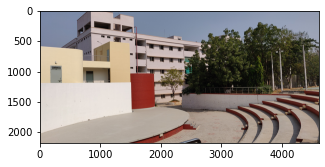

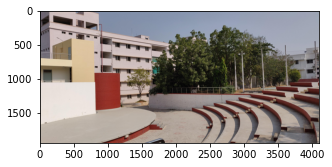

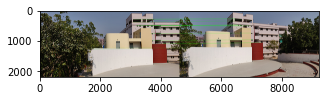

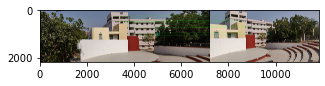

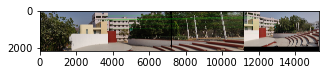

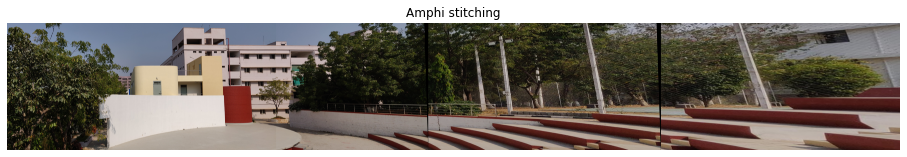

In [340]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/1_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/1_2.jpg')
img3 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/1_3.jpg')
img4 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/1_4.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3g = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img4g = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
plt.imshow(img3g)
plt.figure(figsize=[5,5])
plt.imshow(img4g)
img_list = []
img_list.append(img1g)
img_list.append(img2g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
img_list = []
img_list.append(final_img)
img_list.append(img3g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
img_list = []
img_list.append(final_img)
img_list.append(img4g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
fig = plt.figure(figsize=(16,16))
plt.imshow(final_img)
plt.axis('off')
plt.title('Amphi stitching')
plt.show()

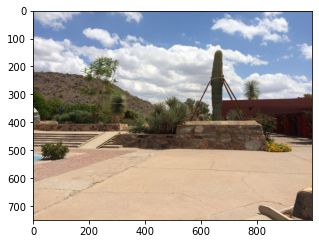

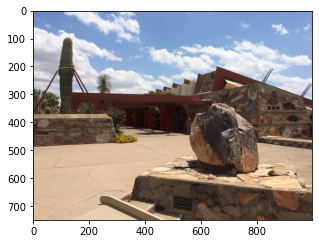

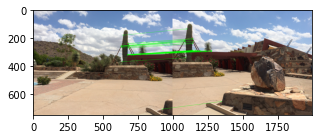

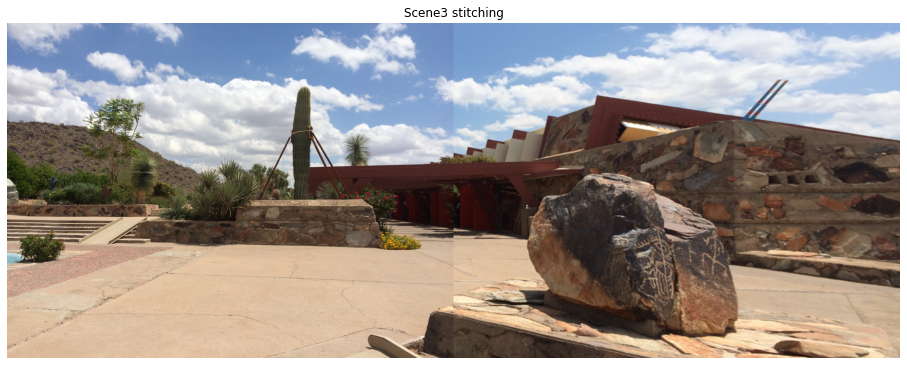

In [15]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/3_1.png')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/3_2.png')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
img_list = []
img_list.append(img1g)
img_list.append(img2g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
fig = plt.figure(figsize=(16,16))
plt.imshow(final_img)
plt.axis('off')
plt.title('Scene3 stitching')
plt.show()

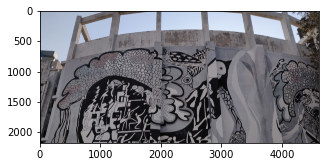

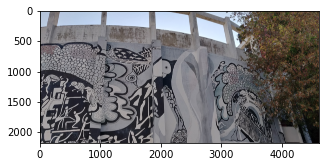

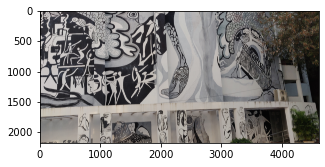

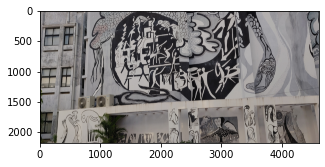

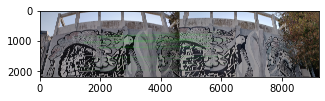

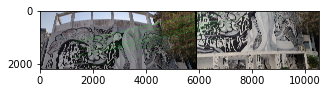

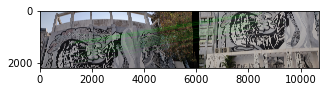

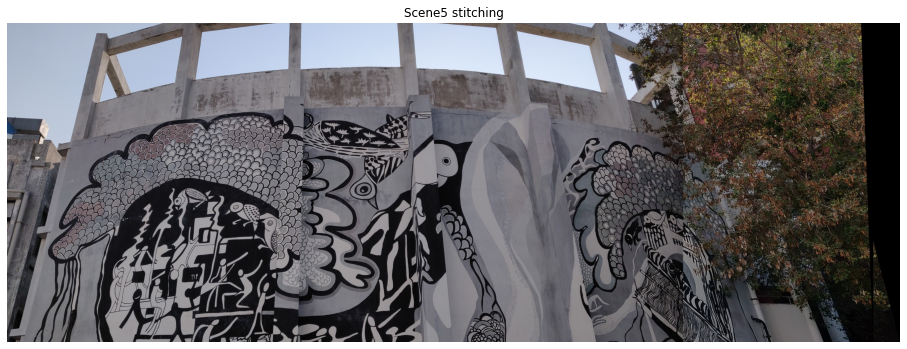

In [19]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/5_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/5_2.jpg')
img3 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/5_3.jpg')
img4 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/5_4.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3g = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img4g = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
plt.imshow(img3g)
plt.figure(figsize=[5,5])
plt.imshow(img4g)
img_list = []
img_list.append(img1g)
img_list.append(img2g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
img_list = []
img_list.append(final_img)
img_list.append(img3g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
img_list = []
img_list.append(final_img)
img_list.append(img4g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
fig = plt.figure(figsize=(16,16))
plt.imshow(final_img)
plt.axis('off')
plt.title('Scene5 stitching')
plt.show()

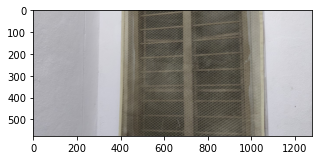

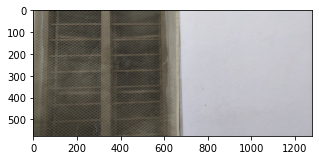

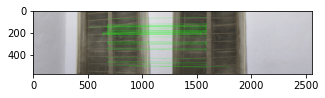

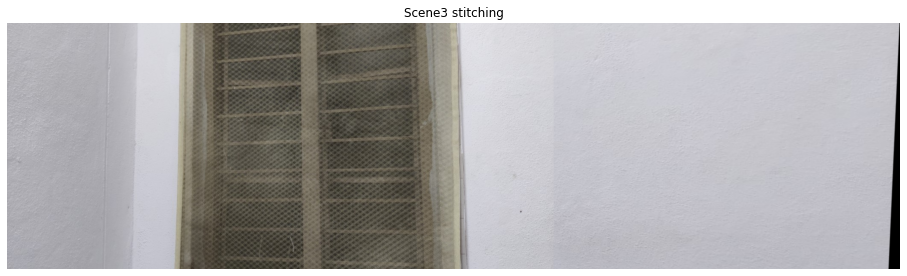

In [24]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/6_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Image Mosaicing/6_2.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
img_list = []
img_list.append(img1g)
img_list.append(img2g)
M = get_transformation(img_list) 
final_img = stitching(img_list,M)
final_img = remove_black(final_img)
fig = plt.figure(figsize=(16,16))
plt.imshow(final_img)
plt.axis('off')
plt.title('Scene3 stitching')
plt.show()

# Stereo Correspondences

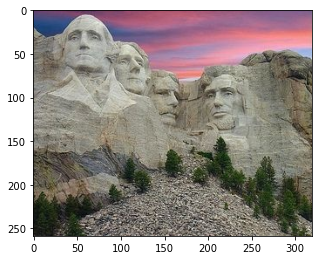

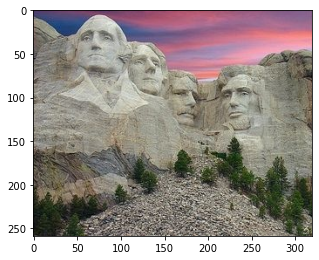

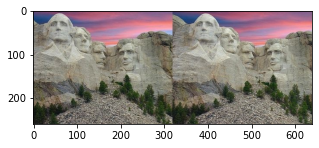

In [39]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/1_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/1_2.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
plt.imshow(stereo1)
plt.show()

### Window Based Correlation
- We define a function corrs that computes the normalised cross correlation.
- We define a Correlation Matching function, which takes two stereo images as inputs.
- The outer loop - (y1,x1) - loops over all the patches/windows in the first image.
- The inner loop - (y2,x2) - helps find the corresponding patch of the first image in the second image. It does so by going through all the patches in the second image and returns that with the best normalised cross correlation between the two patches.

In [40]:
def corrs(v1,v2):
    num = v1.T.dot(v2)
    temp1 = np.sqrt(v1.T.dot(v1))
    temp2 = np.sqrt(v2.T.dot(v2))
    denom = temp1 * temp2
    return (num/denom)
def correlation_matching(img1, img2, window_size=128, stride=128, thresh = 0.01):
    h1, w1, c = img1.shape
    h2, w2, c = img2.shape
    
    # Go through all the patches in img1
    best_matches = []
    for y1 in range(0, h1-window_size, stride):
        for x1 in range(0, w1-window_size, stride):
            # make this 100 for stereo3 case
            least_dis = 1
            least_coord = []
            # find the corresponding patch in img2 with best corrs value
            for y2 in range(0, h2-window_size, stride):
                for x2 in range(0, w2-window_size, stride):
                    v1 = img1[y1:y1+window_size, x1:x1+window_size, :].flatten()
                    v2 = img2[y2:y2+window_size, x2:x2+window_size, :].flatten()
                    dis = corrs(v1,v2)
                    if dis < least_dis:
                        least_dis = dis
                        least_coord = [x1,y1,x2,y2,dis]      
            if(least_coord):
                best_matches.append(least_coord)
            else: 
                continue
    return best_matches

def draw_matches(img, matches, window_size=128):
    h, w, c = img.shape
    for match in matches:
        pt1 = (match[1] + window_size//2, match[0]+window_size//2)
        pt2 = (match[3] + window_size//2 + w//2, match[2]+ window_size//2)
        line_img = cv2.line(img, pt1, pt2, (0,0,225), 3)
        
    plt.imshow(line_img)

-  it simply takes the original image (with both the stereo pairs) and plots the matches as line segments joining the corresponding points for easier visualisation.

Matches in the form of [x1,y1,x2,y2,distance] 

[[128, 0, 0, 0, 0.11884], [0, 128, 128, 128, 0.5015], [128, 128, 0, 0, 0.7915]]


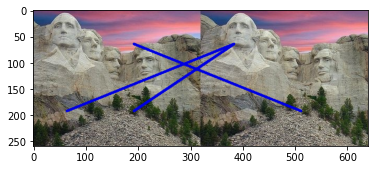

In [41]:
matches1 = correlation_matching(img1g, img2g)
print("Matches in the form of [x1,y1,x2,y2,distance] \n")
print(matches1)
stereo1=cv2.hconcat([img1g,img2g])
draw_matches(stereo1, matches1)

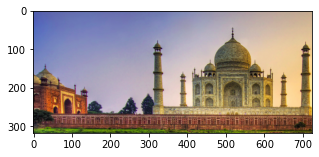

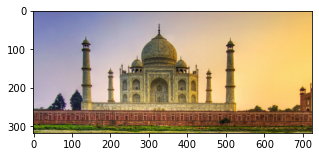

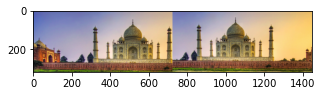

Matches in the form of [x1,y1,x2,y2,distance] 

[[0, 0, 512, 128, 0.305], [128, 0, 0, 0, 0.0161], [256, 0, 256, 0, 0.427], [384, 0, 128, 0, 0.0501], [512, 0, 128, 0, 0.04462], [0, 128, 256, 128, 0.02654], [128, 128, 512, 0, 0.078], [256, 128, 512, 0, 0.9653], [384, 128, 512, 0, 0.04874], [512, 128, 384, 0, 0.0755]]


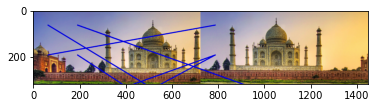

In [53]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/2_1.png')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/2_2.png')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2g=cv2.resize(img2g,(img1g.shape[1],img1g.shape[0]))
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
plt.imshow(stereo1)
plt.show()
matches1 = correlation_matching(img1g, img2g)
print("Matches in the form of [x1,y1,x2,y2,distance] \n")
print(matches1)
stereo1=cv2.hconcat([img1g,img2g])
draw_matches(stereo1, matches1)

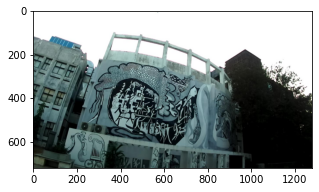

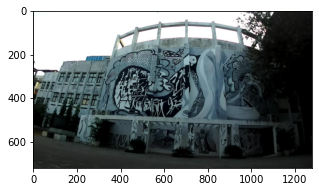

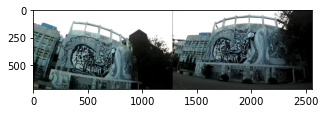

<ipython-input-40-862bc889d49d>:6: RuntimeWarning: divide by zero encountered in true_divide
  return (num/denom)
<ipython-input-40-862bc889d49d>:6: RuntimeWarning: invalid value encountered in true_divide
  return (num/denom)
<ipython-input-40-862bc889d49d>:24: RuntimeWarning: invalid value encountered in less
  if dis < least_dis:


Matches in the form of [x1,y1,x2,y2,distance] 

[[0, 0, 768, 512, 0.008354], [128, 0, 1024, 128, 0.1106], [256, 0, 640, 0, 0.01138], [384, 0, 256, 512, 0.02238], [512, 0, 128, 256, 0.0546], [0, 128, 1024, 512, 0.02475], [128, 128, 640, 384, 0.0], [256, 128, 512, 384, 0.01413], [384, 128, 128, 512, 0.0087], [512, 128, 512, 128, 0.00804], [640, 128, 128, 128, 0.0], [768, 128, 768, 0, 0.07367], [896, 128, 128, 256, 0.01622], [1024, 128, 896, 512, 0.0621], [0, 256, 896, 384, 0.144], [128, 256, 640, 128, 0.01316], [256, 256, 256, 512, 0.0], [384, 256, 512, 128, 0.081], [512, 256, 640, 0, 0.0], [640, 256, 768, 512, 0.09625], [768, 256, 896, 512, 0.0], [896, 256, 640, 512, 0.231], [1024, 256, 640, 512, 0.010155], [0, 384, 896, 512, 0.1694], [128, 384, 640, 384, 0.0], [256, 384, 128, 256, 0.0343], [384, 384, 512, 512, 0.02904], [512, 384, 0, 128, 0.1383], [640, 384, 384, 256, 0.011], [768, 384, 384, 128, 0.00875], [896, 384, 512, 512, 0.1395], [1024, 384, 1024, 384, 0.0958], [0, 512, 640, 384,

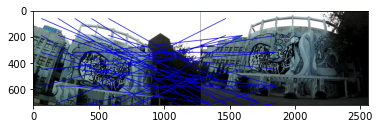

In [55]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/3_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/3_2.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2g=cv2.resize(img2g,(img1g.shape[1],img1g.shape[0]))
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
plt.imshow(stereo1)
plt.show()
matches1 = correlation_matching(img1g, img2g)
print("Matches in the form of [x1,y1,x2,y2,distance] \n")
print(matches1)
stereo1=cv2.hconcat([img1g,img2g])
draw_matches(stereo1, matches1)

### Rectifying the stereo images
- We need to first rectify the pairs of images.
- And then with these new images, we perform intensity window-based correlation again.

In [56]:
def dense_sift_matching(img1,img2,min_match_cnt=500):
    
    # Initiliaze CV2 SIFT
    sift = cv2.xfeatures2d.SIFT_create()

    # Define our keypoints
    h,w,c = img1.shape
    kp=[]
    for i in range(1,h,10):
        for j in range(1,w,10):
            kp.append(cv2.KeyPoint(i, j, 3))
    print("Checking Keypoints",len(kp))
    
    # Taking gray scale images for SIFT
    gray_im1 = cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    kp1,des1 = sift.compute(gray_im1,kp)

    gray_im2 = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    kp2,des2 = sift.compute(gray_im2,kp)

    # BFMatcher with default params
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    matches = bf.match(des1,des2)
    matches = sorted(matches, key = lambda x:x.distance)[0:min_match_cnt]
    print("Found Matches:",len(matches))  
        
    draw_params = dict(matchesMask=None,
                       singlePointColor=None,
                       flags=2)
        
    dis_im = cv2.drawMatches(img1,kp1,img1,kp1,matches,None,**draw_params)
    plt.imshow(dis_im)    
    return kp1,des1,kp2,des2,matches,dis_im
def stereo_rectification(img1,img2,sift_params,match_th =0.8):
    kp1,des1,kp2,des2,_,_ = sift_params
    
    index_params = dict(algorithm = 1, trees = 5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
    # Store best matches
    pts1 = []
    pts2 = []
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.8*n.distance:
            pts2.append(kp2[m.trainIdx].pt)
            pts1.append(kp1[m.queryIdx].pt)
    pts1 = np.float32(pts1)
    pts2 = np.float32(pts2)
    
    F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.RANSAC)

    # We select only inlier points
    pts1 = pts1[mask.ravel()==1]
    pts2 = pts2[mask.ravel()==1]
    img_size = img1.shape[0:2]
    p,H1,H2=cv2.stereoRectifyUncalibrated(pts1, pts2, F, img_size)
    
    H3= H1.dot(H2)
    img1_corrected = cv2.warpPerspective(img1, H1, img_size)
    img2_corrected = cv2.warpPerspective(img2, H3, img_size)
    return img1_corrected, img2_corrected

Checking Keypoints 832
Found Matches: 500


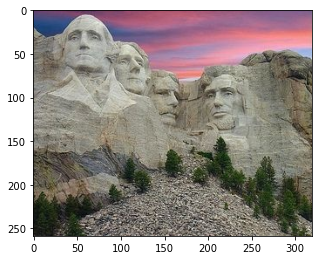

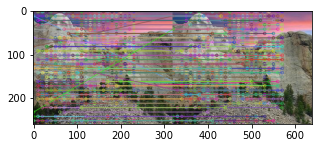

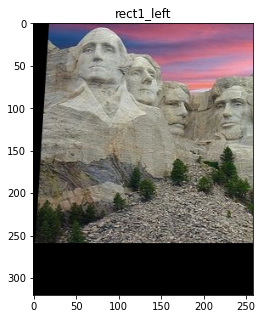

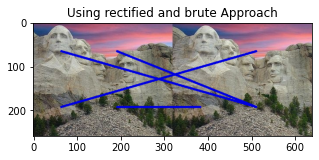

In [87]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/1_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/1_2.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
sift_param = dense_sift_matching(img1g, img2g)
rect1_left, rect1_right = stereo_rectification(img1g,img2g, sift_param, match_th =0.8)
plt.figure(figsize=[5,5])
plt.imshow(rect1_left)
plt.title('rect1_left')
plt.figure(figsize=[5,5])
plt.imshow(rect1_right)
plt.title('rect1_right')
matches1 = correlation_matching(rect1_left, rect1_right)
draw_matches(stereo1, matches1)
plt.title('Using rectified and brute Approach')
plt.show()


Checking Keypoints 9216
Found Matches: 500


<ipython-input-40-862bc889d49d>:6: RuntimeWarning: invalid value encountered in true_divide
  return (num/denom)
<ipython-input-40-862bc889d49d>:24: RuntimeWarning: invalid value encountered in less
  if dis < least_dis:


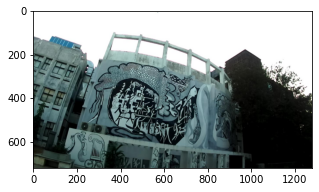

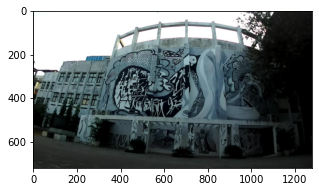

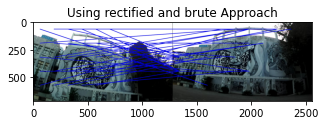

In [88]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/3_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/3_2.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
sift_param = dense_sift_matching(img1g, img2g)
rect1_left, rect1_right = stereo_rectification(img1g,img2g, sift_param, match_th =0.8)
matches1 = correlation_matching(rect1_left, rect1_right)
draw_matches(stereo1, matches1)
plt.title('Using rectified and brute Approach')
plt.show()


Checking Keypoints 2336
Found Matches: 243


<ipython-input-40-862bc889d49d>:6: RuntimeWarning: invalid value encountered in true_divide
  return (num/denom)
<ipython-input-40-862bc889d49d>:24: RuntimeWarning: invalid value encountered in less
  if dis < least_dis:


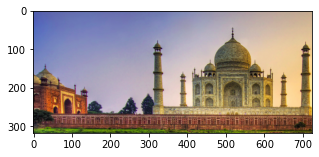

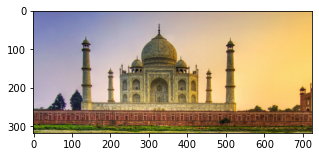

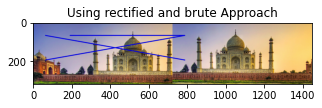

In [86]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/2_1.png')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/2_2.png')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2g=cv2.resize(img2g,(img1g.shape[1],img1g.shape[0]))
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.figure(figsize=[5,5])
sift_param = dense_sift_matching(img1g, img2g)
rect1_left, rect1_right = stereo_rectification(img1g,img2g, sift_param, match_th =0.8)
matches1 = correlation_matching(rect1_left, rect1_right)
draw_matches(stereo1, matches1)
plt.title('Using rectified and brute Approach')
plt.show()


### Greedy Matching for Stereo Correspondences
- This matching works by finding the longest common subsequence between two lines.
- Here the lines are epipolar lines of the 2 stereo images
- We compute the longest subsequence on the epipolar lines of the 2 stereo images.

In [91]:
def drawlines(img1,img2,lines,pts1,pts2):
    r,c,_ = img1.shape
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2
def longest_common_subsequence(line1, line2):
    dp = np.zeros((line1.shape[0]+1,line2.shape[0]+1))
    
    for i,x in enumerate(line1):
        for j,y in enumerate(line2):
            if(i==0 or j==0):
                continue
            elif (line1[i-1] == line1[j-1]): 
                dp[i,j] = 1 + dp[i-1][j-1]
            else:
                dp[i,j] = max(dp[i-1,j], dp[i,j-1])

    i = line1.shape[0], j = line2.shape[0]; 
    lcs = np.zeros(line1.shape[0])
    index = line1.shape[0]
    while (i > 0 and j > 0) : 
        if (line1[i-1] == line2[j-1]): 
            lcs[index-1] = line1[i-1]
            i-=1
            j-=1
            index-=1 
      
        elif (dp[i-1,j] > dp[i,j-1]): 
            i-=1 
        else:
            j-=1
    return lcs
def plot_epipolar_lines(img1,img2,sift_params,match_th =0.8):
    kp1,des1,kp2,des2,_,_ = sift_params
    
    index_params = dict(algorithm = 1, trees = 5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
#     Store best matches
    pts1 = []
    pts2 = []
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.8*n.distance:
            pts2.append(kp2[m.trainIdx].pt)
            pts1.append(kp1[m.queryIdx].pt)
    pts1 = np.float32(pts1)
    pts2 = np.float32(pts2)
    
    F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.RANSAC)

    # We select only inlier points
    pts1 = pts1[mask.ravel()==1]
    pts2 = pts2[mask.ravel()==1]
 
    lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
    lines1 = lines1.reshape(-1,3)
    img3,img4 = drawlines(img1,img2,lines1,pts1,pts2)

    # Find epilines corresponding to points in left image (first image) and
    # drawing its lines on right image
    lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
    lines2 = lines2.reshape(-1,3)
    img5,img6 = drawlines(img2,img1,lines2,pts2,pts1)
    
    return lines1, lines2, img3, img4, img5, img6

- Computes the LCS between two epipolar lines.
- dp[i,j] = max(C(i - 1, j - 1)  + dp[i-1, j-1], dp[i-1,j]. dp[i,j-1])

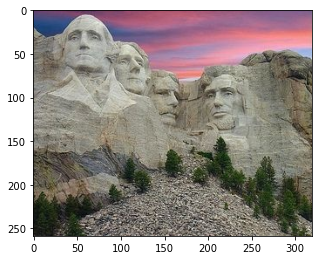

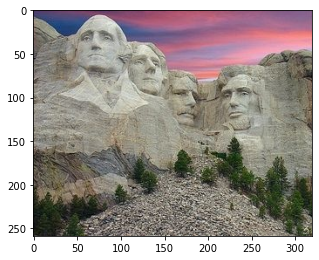

Checking Keypoints 832
Found Matches: 500


<ipython-input-91-190f1d0a7b22>:8: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
<ipython-input-91-190f1d0a7b22>:9: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img2 = cv2.circle(img2,tuple(pt2),5,color,-1)


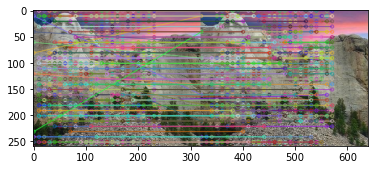

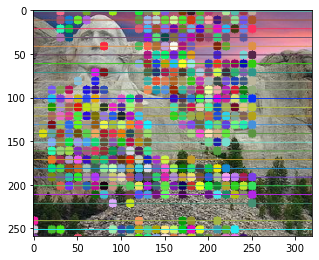

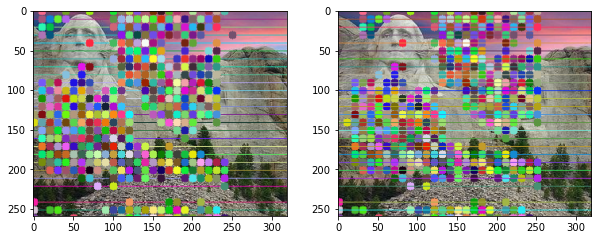

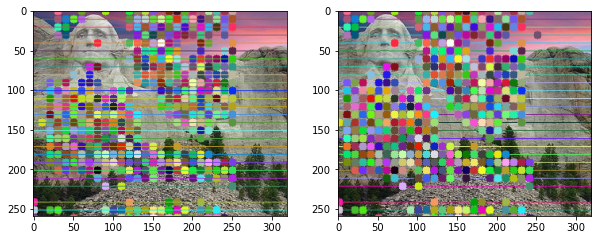

In [103]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/1_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/1_2.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.show()
sift_param = dense_sift_matching(img1g, img2g)
l1, l2, i3, i4, i5, i6 = plot_epipolar_lines(img1g, img2g, sift_param)
plt.figure(figsize=[5,5])
plt.imshow(i4)
plt.figure(figsize=[10,10])
plt.subplot(121)
plt.imshow(i3)
plt.subplot(122)
plt.imshow(i4)
plt.figure(figsize=[10,10])
plt.subplot(121)
plt.imshow(i5)
plt.subplot(122)
plt.imshow(i6)
plt.show()

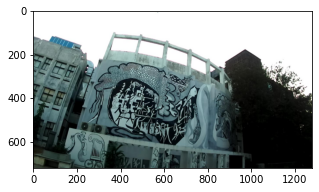

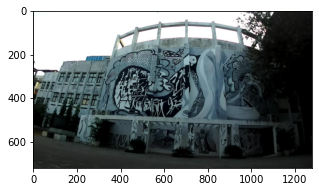

Checking Keypoints 9216
Found Matches: 500


<ipython-input-91-190f1d0a7b22>:8: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
<ipython-input-91-190f1d0a7b22>:9: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img2 = cv2.circle(img2,tuple(pt2),5,color,-1)


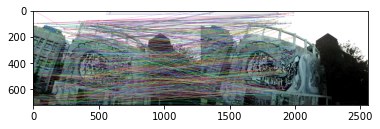

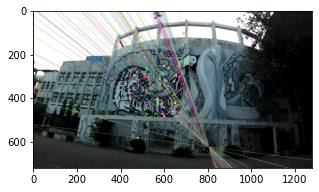

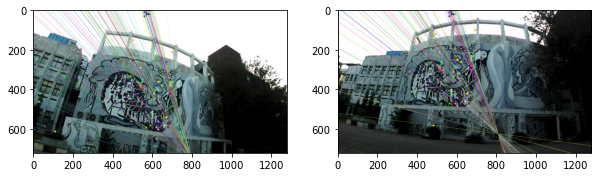

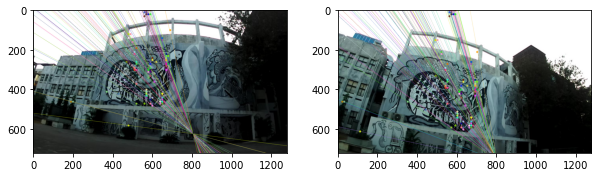

In [102]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/3_1.jpg')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/3_2.jpg')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.show()
sift_param = dense_sift_matching(img1g, img2g)
l1, l2, i3, i4, i5, i6 = plot_epipolar_lines(img1g, img2g, sift_param)
plt.figure(figsize=[5,5])
plt.imshow(i4)
plt.figure(figsize=[10,10])
plt.subplot(121)
plt.imshow(i3)
plt.subplot(122)
plt.imshow(i4)
plt.figure(figsize=[10,10])
plt.subplot(121)
plt.imshow(i5)
plt.subplot(122)
plt.imshow(i6)
plt.show()

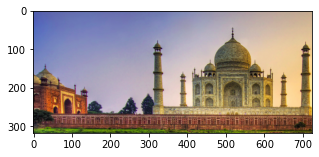

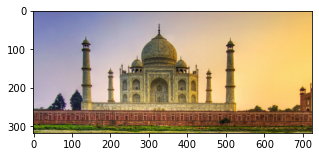

Checking Keypoints 2336
Found Matches: 243


<ipython-input-91-190f1d0a7b22>:8: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
<ipython-input-91-190f1d0a7b22>:9: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img2 = cv2.circle(img2,tuple(pt2),5,color,-1)


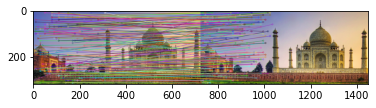

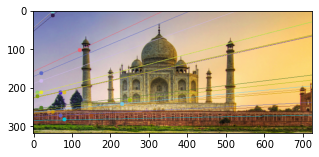

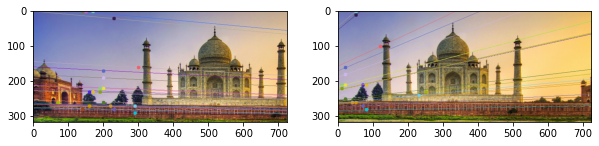

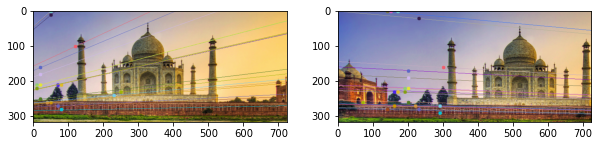

In [101]:
img1 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/2_1.png')
img2 = cv2.imread('C:/Users/91709/Desktop/CV/assignment-2-rez39/images/Stereo Correspondence/2_2.png')
img1g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2g = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2g=cv2.resize(img2g,(img1g.shape[1],img1g.shape[0]))
stereo1=cv2.hconcat([img1g,img2g])
plt.figure(figsize=[5,5])
plt.imshow(img1g)
plt.figure(figsize=[5,5])
plt.imshow(img2g)
plt.show()
sift_param = dense_sift_matching(img1g, img2g)
l1, l2, i3, i4, i5, i6 = plot_epipolar_lines(img1g, img2g, sift_param)
plt.figure(figsize=[5,5])
plt.imshow(i4)
plt.figure(figsize=[10,10])
plt.subplot(121)
plt.imshow(i3)
plt.subplot(122)
plt.imshow(i4)
plt.figure(figsize=[10,10])
plt.subplot(121)
plt.imshow(i5)
plt.subplot(122)
plt.imshow(i6)
plt.show()